<a href="https://colab.research.google.com/github/priya-200/AI-Spot-The-Difference/blob/main/Spot_the_difference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
In this project we are going to devlop a project in which the program will be able to even say a slightest difference from two images

We here uses **Structural Similarity Index(SSIM)** To spot the difference between two images


## Import Statement

In [28]:
import numpy as np
import cv2
import os
from datetime import datetime
import matplotlib.pyplot as plt
from IPython.display import Image
from skimage.metrics import structural_similarity

## Python Functions

In [29]:
def show_images(img_1,img_2,w,h):
  img1 = plt.imread(img_1)
  img2 = plt.imread(img_2)
  f,ax = plt.subplots(1,2,figsize = (w,h))
  ax[0].imshow(img1)
  ax[1].imshow(img2)
  ax[0].set_title("Image1 : "+img_1)
  ax[1].set_title("Image2 : "+img_2)
  title = 'Spot the difference between these two images.'
  f.suptitle(title,fontsize = 18)
  plt.tight_layout()
  plt.show()

In [41]:
def spot_the_difference(image1_path, image2_path, minval):

    RES_DIR = 'outputs'
    os.makedirs(RES_DIR, exist_ok=True)

    green = (0, 255, 0)
    red = (0, 0, 255)
    cyan = (255, 255, 0)

    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)

    if img1 is None or img2 is None:
        raise FileNotFoundError("❌ One or both input images not found.")

    img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    (score, diff) = structural_similarity(img1_gray, img2_gray, full=True)
    diff = (diff * 255).astype("uint8")

    thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    mask = np.zeros(img1.shape, dtype='uint8')
    filled_img = img2.copy()
    nb_differences = 0

    for c in contours:
        area = cv2.contourArea(c)
        if area > minval:
            x, y, w, h = cv2.boundingRect(c)
            txt = str(nb_differences + 1)

            cv2.rectangle(img1, (x, y), (x + w, y + h), red, 2)
            cv2.rectangle(img2, (x, y), (x + w, y + h), red, 2)
            cv2.drawContours(mask, [c], -1, green, -1)
            cv2.drawContours(filled_img, [c], -1, cyan, -1)

            nb_differences += 1

    basename = "content"
    image1_out = os.path.join(RES_DIR, f"{basename}_image1.jpg")
    image2_out = os.path.join(RES_DIR, f"{basename}_image2.jpg")
    maskimage_out = os.path.join(RES_DIR, f"{basename}_mask.jpg")
    filled_out = os.path.join(RES_DIR, f"{basename}_filled_img.jpg")

    cv2.imwrite(image1_out, img1)
    cv2.imwrite(image2_out, img2)
    cv2.imwrite(maskimage_out, mask)
    cv2.imwrite(filled_out, filled_img)

    print("✅ Similarity: ", round(score * 100, 2), "%")

    return image1_out, image2_out, maskimage_out, filled_out, nb_differences, score

In [42]:
def viewing_images(w, h, image1, image2, filled_image, maskimage, nb_differences, score):
    RES_DIR = 'outputs'

    print("\033[1;31;91mNumber of differences =", nb_differences, "| similarity index =", score, '\033[0m')

    fig = plt.figure(figsize=(w, h))
    rows = columns = 2

    fig.add_subplot(rows, columns, 1)
    plt.imshow(cv2.cvtColor(cv2.imread(image1), cv2.COLOR_BGR2RGB))
    plt.title("Initial image")

    fig.add_subplot(rows, columns, 2)
    plt.imshow(cv2.cvtColor(cv2.imread(image2), cv2.COLOR_BGR2RGB))
    plt.title("Second image")

    fig.add_subplot(rows, columns, 3)
    plt.imshow(cv2.cvtColor(cv2.imread(filled_image), cv2.COLOR_BGR2RGB))
    plt.title("Filled Image")

    fig.add_subplot(rows, columns, 4)
    plt.imshow(cv2.cvtColor(cv2.imread(maskimage), cv2.COLOR_BGR2RGB))
    plt.title("Mask Image")

    plt.tight_layout()
    plt.savefig(os.path.join(RES_DIR, "comparison_result_all.jpg"))
    plt.show()


In [43]:
imagefile1 = 'ID1.jpg'
imagefile2 = 'ID2.jpg'

image1, image2, maskimage, filled_image, nb_differences, score = spot_the_difference(imagefile1, imagefile2,50)

✅ Similarity:  99.39 %


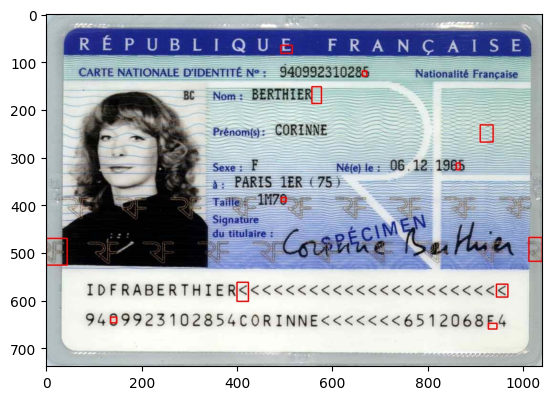

In [44]:
plt.imshow(cv2.cvtColor(cv2.imread(image1), cv2.COLOR_BGR2RGB))

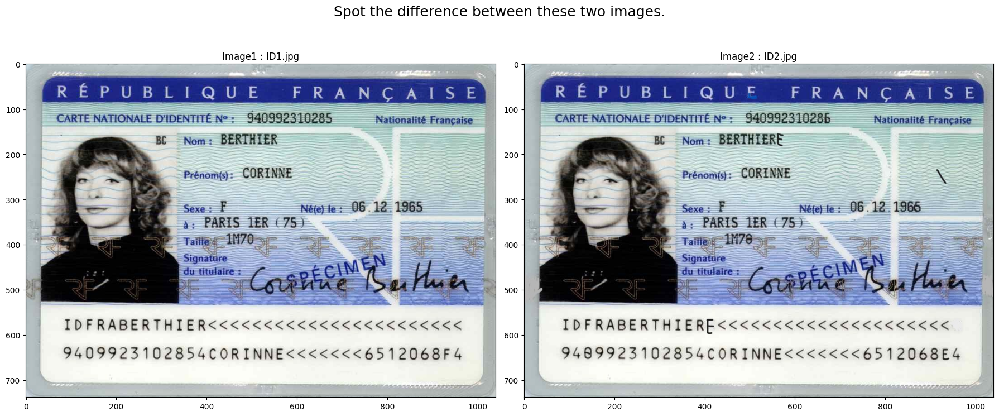

In [45]:
show_images(imagefile1, imagefile2, 18, 8)

Number of differences = 12 | similarity index = 0.9938826612546015 


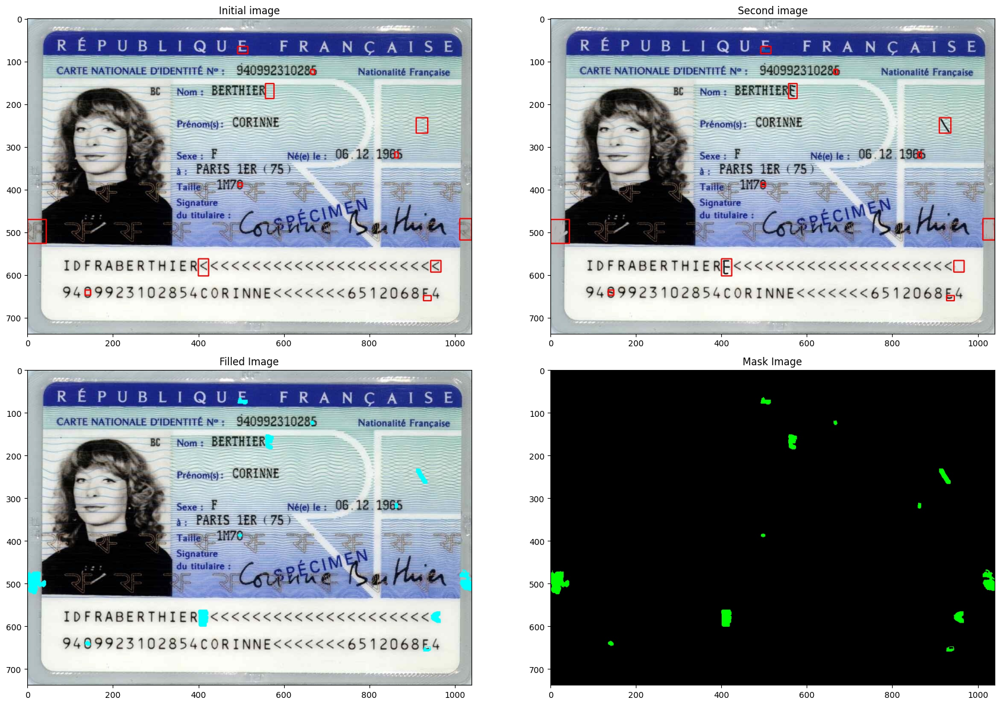

In [46]:
viewing_images(18, 12, image1, image2, filled_image, maskimage, nb_differences, score)

## Example 2

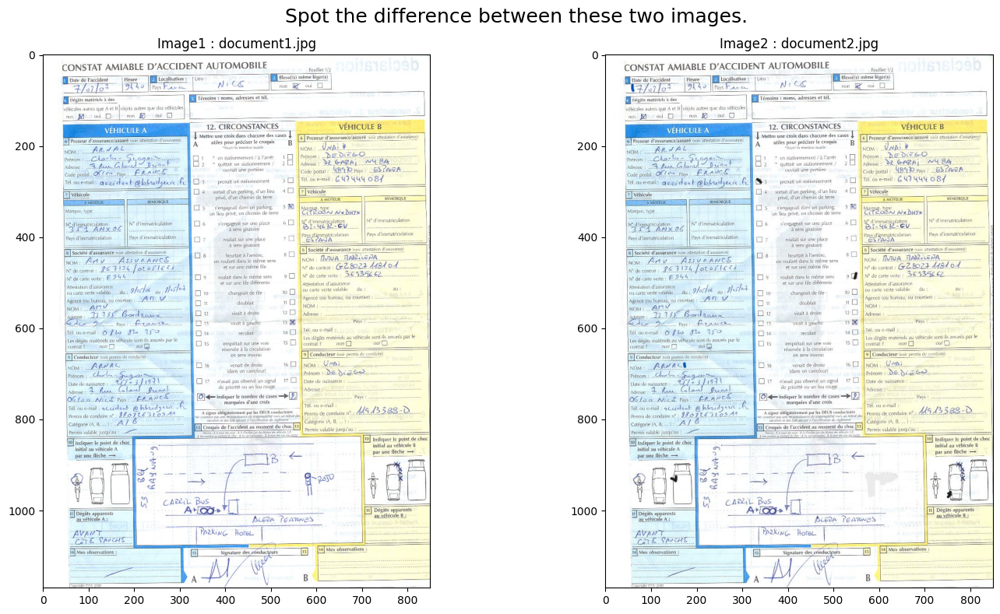

In [49]:
imagefile1 = 'document1.jpg'
imagefile2 = 'document2.jpg'
show_images(imagefile1, imagefile2, 15, 8)

In [50]:
image1, image2, maskimage, filled_image, nb_differences, score = spot_the_difference(imagefile1, imagefile2,50)

✅ Similarity:  99.23 %


Number of differences = 7 | similarity index = 0.9923081374950058 


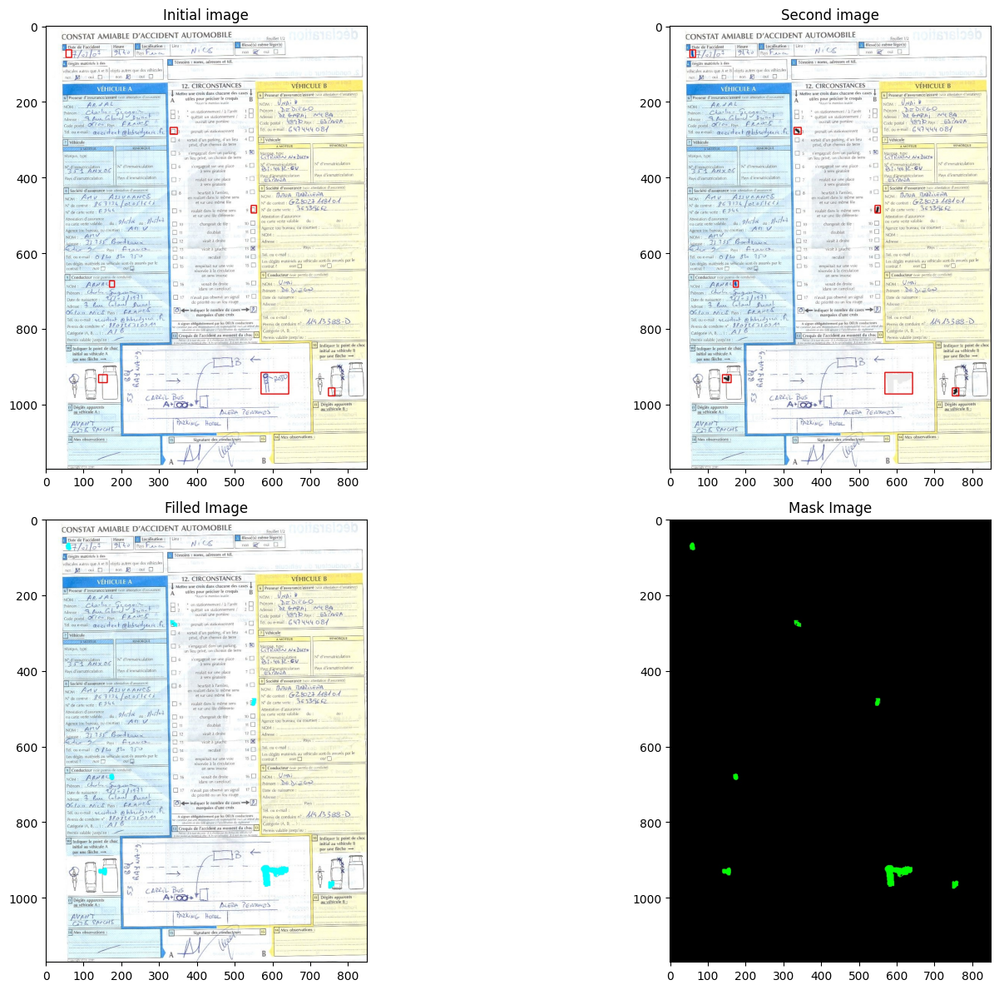

In [51]:
viewing_images(18, 12, image1, image2, filled_image, maskimage, nb_differences, score)

## Example 3

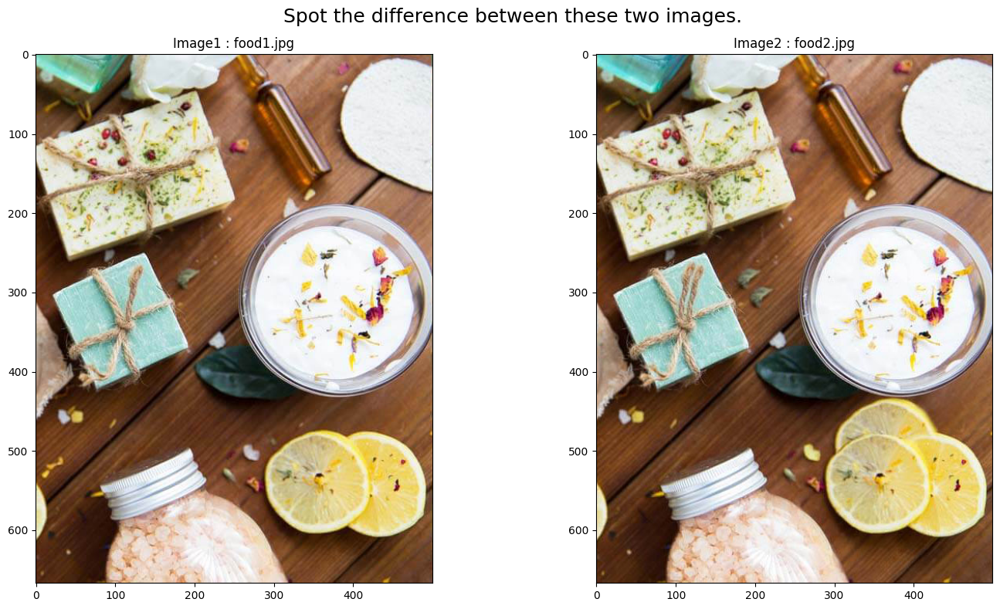

In [52]:
imagefile1 = 'food1.jpg'
imagefile2 = 'food2.jpg'
show_images(imagefile1, imagefile2, 15, 8)

In [53]:
image1, image2, maskimage, filled_image, nb_differences, score = spot_the_difference(imagefile1, imagefile2,50)

✅ Similarity:  91.99 %


Number of differences = 6 | similarity index = 0.9198863419190031 


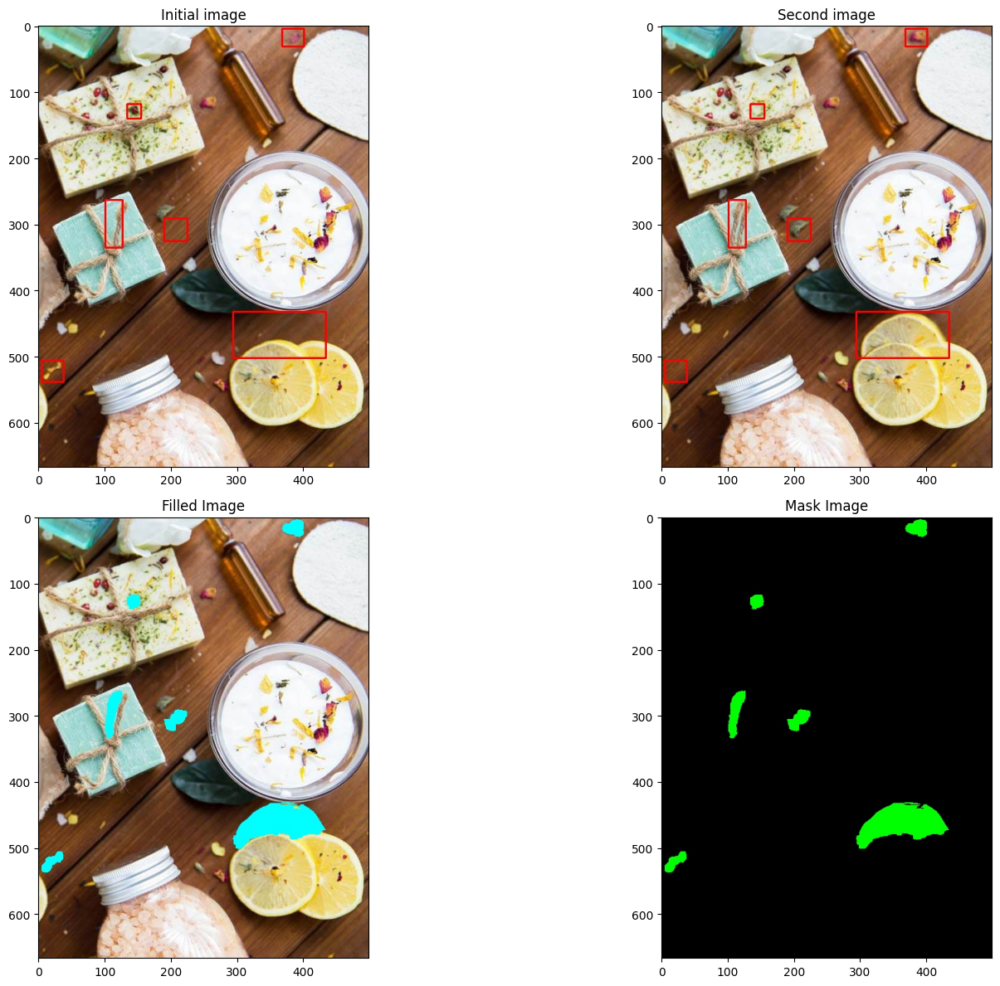

In [54]:
viewing_images(18, 12, image1, image2, filled_image, maskimage, nb_differences, score)